## Imports

In [1]:
import re
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

from os      import listdir
from os.path import isfile, join

## Auxiliar Functions

In [2]:
def print_dataframe(df):
    style_df = (df.style.set_properties(**{'text-align': 'left'})
                                        .set_table_styles([ dict(selector='th',
                                                                 props=[('text-align','left')])])
                   )
    return style_df

def get_txts(path):
    years = [join(path, x) for x in listdir(path) if not isfile(join(path, x))]
    txts = []
    for year in years:
        months = [join(year, x) for x in listdir(year) if not isfile(join(year, x))]
        for month in months:
            txts += [join(month, x) for x in listdir(month) if isfile(join(month, x))]
    return txts

## Open DODFS

In [3]:
dodfs_space_dir = "./data/dodfs_txt_espaco"
dodfs_space_files = get_txts(dodfs_space_dir)

dodfs_n_dir = "./data/dodfs_txt_barra_n"
dodfs_n_files = get_txts(dodfs_n_dir)

output = "./results"

In [4]:
test_file = open(dodfs_n_files[1], "r")
test_txt = test_file.read()

## Regex Base Class

In [5]:
class Regex:
    
    def __init__(self, text):
        self._text = text
        self._raw_acts = {}
        self._acts = []
        self._columns = []
        self.data_frame = pd.DataFrame()
    
    def find_all(self, rule, flag=0):
        return re.findall(rule, self._text, flags=flag)
    
    def find_in_act(self, rule, act):
        rule = re.compile(rule, re.IGNORECASE)
        for match in re.finditer(rule, act):
            return match.groups()
        return "nan"
    
    def _build_dataframe(self):
        if len(self._acts) > 0:
            df = pd.DataFrame(self._acts)
            df.columns = self._columns
            return df
        return pd.DataFrame()

## Aposentadorias

In [6]:
class Retirements(Regex):
    
    def __init__(self, text):
        super().__init__(text)
        self._columns = ["Tipo do Ato", "SEI", "Nome", "Matrícula", "Tipo de Aposentadoria", "Cargo", "Classe",
               "Padrao", "Quadro", "Fundamento Legal", "Orgao", "Vigencia", "Matricula SIAPE"]
        
        self.rules = {"nome": "\s([^,]*?),\smatricula",
                      "matricula":"matricula\s?n?o?\s([\s\S]*?)[,|\s]",
                      "tipo_ret": "",
                      "cargo": "Cargo de([\s\S]*?)\,",
                      "classe": "[C|c]lasse ([\s\S]*?)\,",
                      "padrao": "[p|P]adr[a|ã]o\s([\s\S]*?),",
                      "quadro": "d?[e|a|o]?(Quadro[\s\S]*?)[,|;|.]",
                      "fundamento": "nos\stermos\sdo\s[a|A]rtigo([\s\S]*?),\sa?\s",
                      "orgao": "Lotacao:|Quadro de Pessoal d[a|e|o]([\s\S]*?)[.|,]",
                      "vigencia": "",
                      "siape": "[S|s][I|i][A|a][P|p][E|e]\s[N|n]?[o|O]?\s([\s\S]*?)[,| | .]"}
                      
        self._raw_acts = self._extract_instances()   
        self._acts = self._acts_props()
        self.data_frame = self._build_dataframe()
        
        
    
    def _act_props(self, sei, act_raw):
        act = {}
        act["tipo_ato"] = "Aposentadoria"
        act["sei"] = sei
        for key in self.rules:
            try:
                act[key], = self.find_in_act(self.rules[key], act_raw)
            except:
                act[key] = "nan"

        return act
    
    def _acts_props(self):
        acts = []
        for sei, raw in self._raw_acts.items():
            act = self._act_props(sei, raw)
            acts.append(act)
        return acts        
        
    
    def _extract_instances(self):
        start = "(APOSENTAR|CONCEDER\sAPOSENTADORIA),?\s?"
        body = "([\s\S]*?)"
        end = "[P|p]rocesso:?\s[s|S]?[e|E]?[i|I]?\s?[n|N]?[o|O]?\s?([\s\S]*?)[.]\s"
        rule = start + body + end
        found = self.find_all(rule)
        results = {}
        for instance in found:
            start, body, sei = instance
            results[sei] = body
            
        return results

## DataFrame

In [7]:
res_dfs = []
for txt in dodfs_n_files:
    txt_str = open(txt, "r").read()
    ret = Retirements(txt_str)
    if not ret.data_frame.empty:
        res_dfs.append(ret.data_frame)

rets_final = pd.concat([pd.DataFrame(df) for df in res_dfs],
                        ignore_index=True)
print_dataframe(rets_final)

# Análise

## Presença - Nome

In [8]:
presence_name = rets_final["Nome"].value_counts()
total = rets_final.count()
presence_name[0]
total[0]

4315

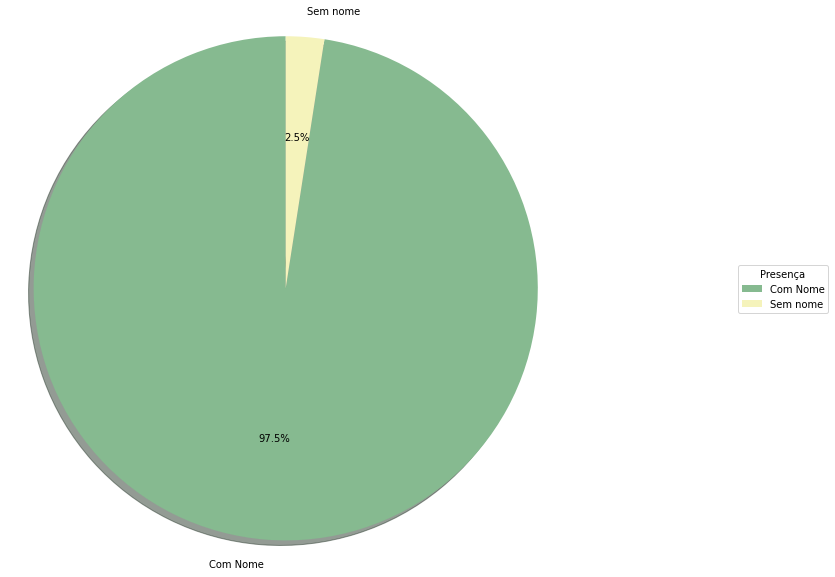

In [9]:
labels = ["Com Nome", "Sem nome"]
sizes = [total[0] - presence_name[0], presence_name[0]]
colors = ['#86BA90', '#F5F3BB']
fig1, ax1 = plt.subplots(figsize=(10,10))
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, colors=colors)
ax1.axis("equal")
ax1.legend(labels, title='Presença', 
           loc='center left', 
           bbox_to_anchor=(1.3, 0, 0.5, 1))
plt.show()

## Presença - Matrícula 

In [10]:
presence_registration = rets_final["Matrícula"].value_counts()
presence_registration
wrong_registrations = 0
for i in range(0, 5):
    wrong_registrations += presence_registration[i]
    
wrong_registrations

86

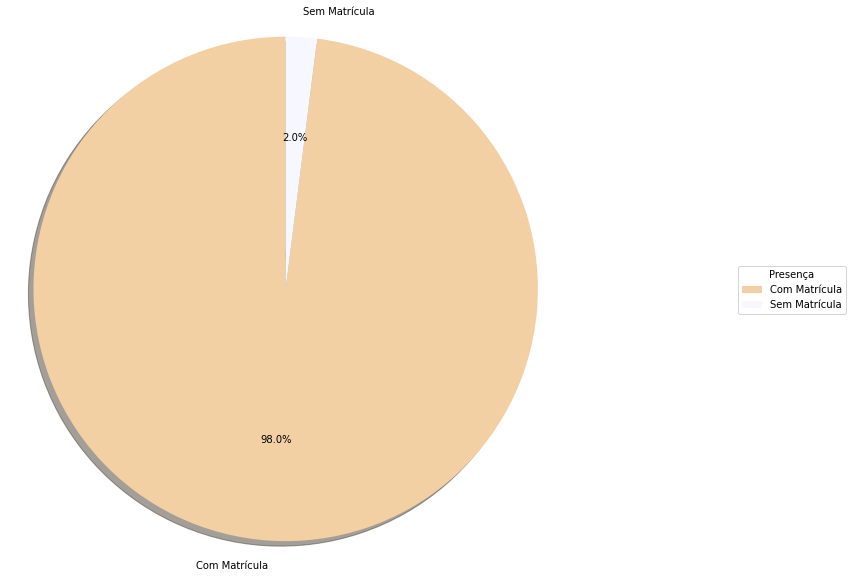

In [11]:
labels = ["Com Matrícula", "Sem Matrícula"]
sizes = [total[3] - wrong_registrations, wrong_registrations]
colors = ['#f2d0a4', '#F7F7FF']
fig1, ax1 = plt.subplots(figsize=(10,10))
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, colors=colors)
ax1.axis("equal")
ax1.legend(labels, title='Presença', 
           loc='center left', 
           bbox_to_anchor=(1.3, 0, 0.5, 1))
plt.show()

## Presença - Cargo

In [12]:
presence_role = rets_final["Cargo"].value_counts()
presence_role[2]
total[5]

4315

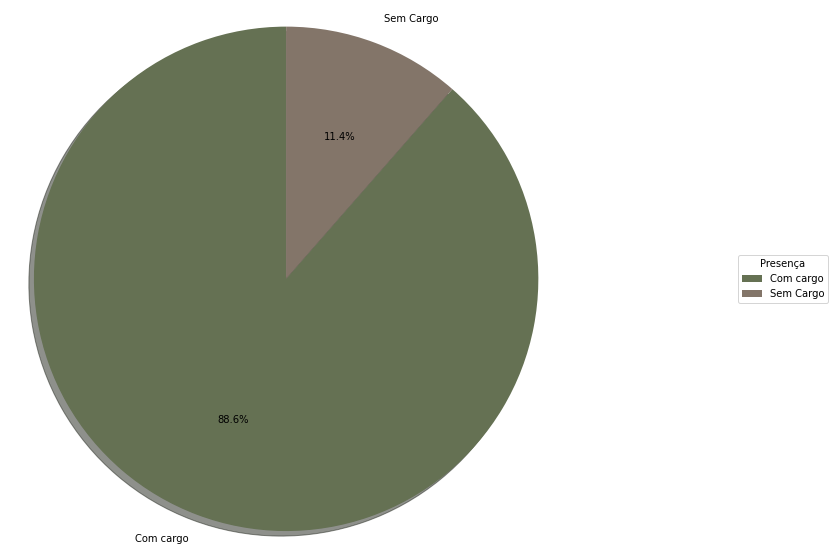

In [13]:
labels = ["Com cargo", "Sem Cargo"]
sizes = [total[5] - presence_role[2], presence_role[2]]
colors = ['#657153', '#837569']
fig1, ax1 = plt.subplots(figsize=(10,10))
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, colors=colors)
ax1.axis("equal")
ax1.legend(labels, title='Presença', 
           loc='center left', 
           bbox_to_anchor=(1.3, 0, 0.5, 1))
plt.show()

## Presença - Quadro

In [14]:
presence_board = rets_final["Quadro"].value_counts()
total[8] 

all_keys = presence_board.keys()
for i in range(0, len(all_keys)):
    if all_keys[i] == "nan":
        index = i
presence_board[index]

5

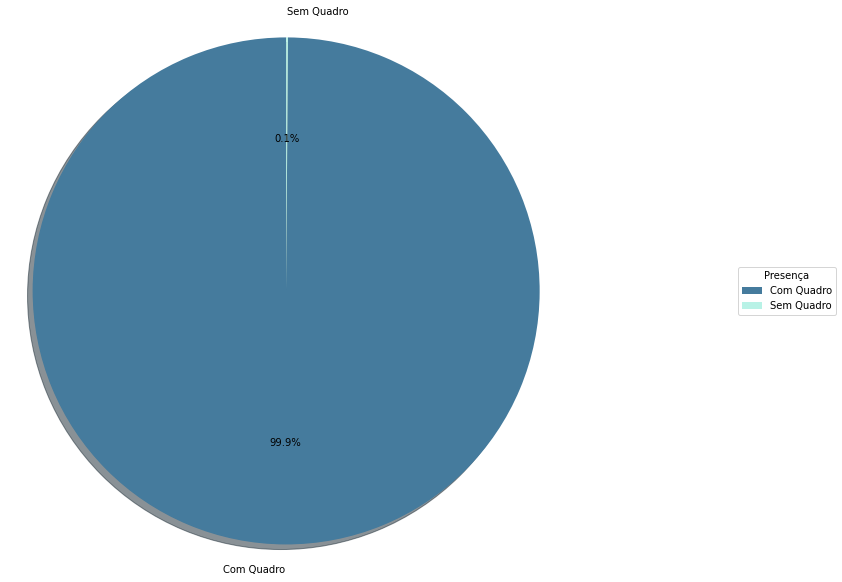

In [15]:
labels = ["Com Quadro", "Sem Quadro"]
sizes = [total[8] - presence_board[index], presence_board[index]]
colors = ['#457b9d', '#b8f2e6']
fig1, ax1 = plt.subplots(figsize=(10,10))
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, colors=colors)
ax1.axis("equal")
ax1.legend(labels, title='Presença', 
           loc='center left', 
           bbox_to_anchor=(1.3, 0, 0.5, 1))
plt.show()

## Presença - Fundamento Legal

In [16]:
presence_legal_foundation = rets_final["Fundamento Legal"].value_counts()
total[7]
presence_legal_foundation[0]

1662

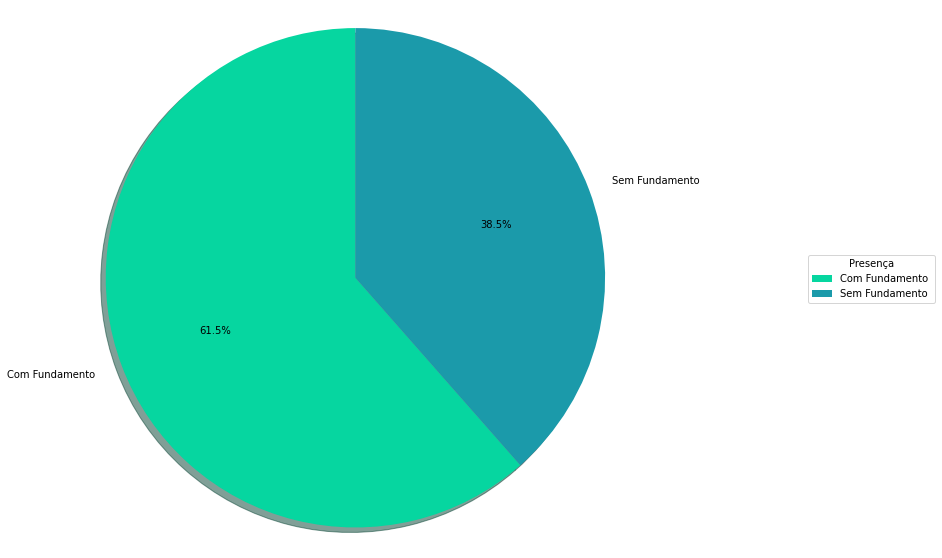

In [17]:
labels = ["Com Fundamento ", "Sem Fundamento"]
sizes = [total[7] - presence_legal_foundation[0], presence_legal_foundation[0]]
colors = ['#06d6a0', '#1b9aaa']
fig1, ax1 = plt.subplots(figsize=(10,10))
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, colors=colors)
ax1.axis("equal")
ax1.legend(labels, title='Presença', 
           loc='center left', 
           bbox_to_anchor=(1.3, 0, 0.5, 1))
plt.show()

## Presença - Órgão

In [18]:
presence_agency = rets_final["Orgao"].value_counts()
presence_agency[1]
none = total[0] - total[10]
wrong = none + presence_agency[1]

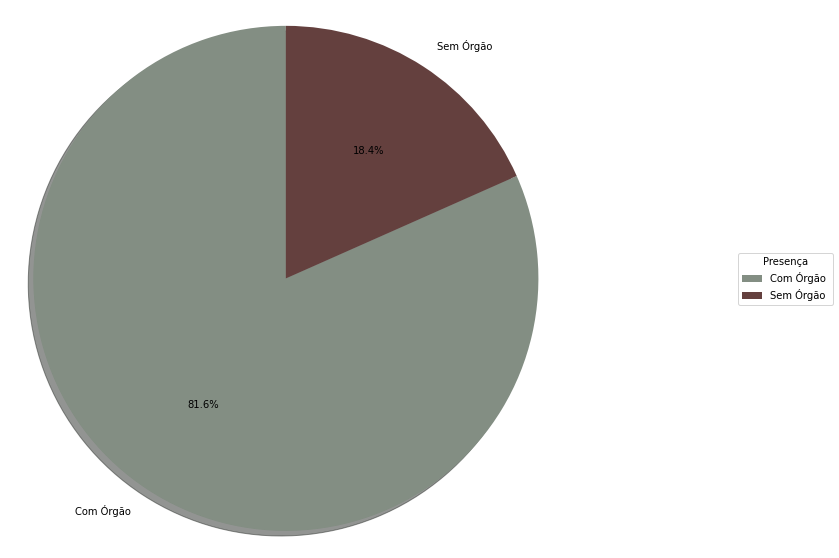

In [19]:
labels = ["Com Órgão ", "Sem Órgão"]
sizes = [total[0] - wrong, wrong]
colors = ['#838e83', '#64403e']
fig1, ax1 = plt.subplots(figsize=(10,10))
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, colors=colors)
ax1.axis("equal")
ax1.legend(labels, title='Presença', 
           loc='center left', 
           bbox_to_anchor=(1.3, 0, 0.5, 1))
plt.show()

## Presença - Processo GDF/SEI

In [20]:
presence_process = rets_final["SEI"].value_counts()
total[1]
index_2 = 0
all_keys = presence_process.keys()
for i in range(0, len(all_keys)):
    if all_keys[i] == "nan":
        index_2 = i
nan = presence_process[index_2]
nan

3

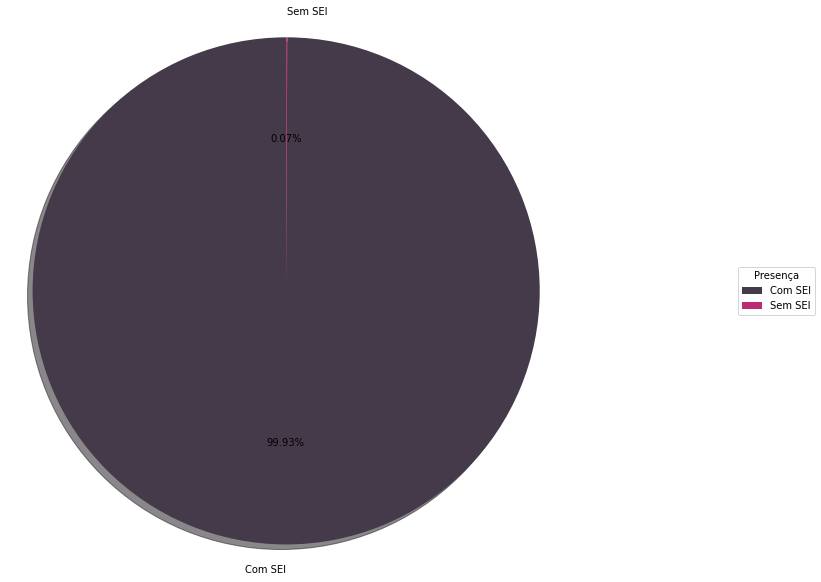

In [21]:
labels = ["Com SEI", "Sem SEI"]
sizes = [total[1] - nan, nan]
colors = ['#453a49', '#ba2c73']
fig1, ax1 = plt.subplots(figsize=(10,10))
ax1.pie(sizes, labels=labels, autopct='%1.2f%%', shadow=True, startangle=90, colors=colors)
ax1.axis("equal")
ax1.legend(labels, title='Presença', 
           loc='center left', 
           bbox_to_anchor=(1.3, 0, 0.5, 1))
plt.show()

# Tabela Resumo

In [22]:
def percentage(num1, num2):
    percentage = '{0:.1f}'.format((num1 / num2 * 100))
    return percentage

percentages = [percentage(total[0] - presence_name[0], total[0]), 
               percentage(total[3] - wrong_registrations, total[0]),
               percentage(total[5] - presence_role[2], total[0]),
               percentage(total[8] - presence_board[index], total[0]),
               percentage(total[7] - presence_legal_foundation[0], total[0]),
               percentage(total[0] - wrong, total[0]),
               percentage(total[1] - nan, total[0]),
              ]
percentages

['97.5', '98.0', '88.6', '99.9', '61.5', '81.6', '99.9']

In [23]:
atos = ["Nome", "Matrícula", "Cargo", "Quadro", "Fundamento", "Órgão","SEI"]

percentage_table ={"Atos": atos, "% de presença": percentages}

percentage_table = pd.DataFrame(percentage_table).style.set_properties(**{'text-align': 'left'}).set_table_styles([ dict(selector='th', props=[('text-align','left')] ) ])
percentage_table

,Atos,% de presença
0,Nome,97.5
1,Matrícula,98.0
2,Cargo,88.6
3,Quadro,99.9
4,Fundamento,61.5
5,Órgão,81.6
6,SEI,99.9
